<a href="https://colab.research.google.com/github/ck0121/Flag-Classification/blob/master/Flag_Detectron2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# install dependencies: 
!pip install pyyaml==5.1 pycocotools>=2.0.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

1.6.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [3]:
# install detectron2: (Colab has CUDA 10.1 + torch 1.6)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
assert torch.__version__.startswith("1.6")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html


In [4]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

In [6]:
from google.colab import files
uploaded = files.upload()

Saving Detectron2.zip to Detectron2.zip


In [7]:
!unzip Detectron2.zip

Archive:  Detectron2.zip
   creating: Detectron2/
   creating: Detectron2/test/
  inflating: Detectron2/test/0009.jpg  
  inflating: Detectron2/test/0009.xml  
  inflating: Detectron2/test/0036.jpg  
  inflating: Detectron2/test/0039.jpg  
  inflating: Detectron2/test/0039.xml  
  inflating: Detectron2/test/0042.jpg  
  inflating: Detectron2/test/0044.jpg  
  inflating: Detectron2/test/0045.jpg  
  inflating: Detectron2/test/0048.jpg  
  inflating: Detectron2/test/0049.jpg  
  inflating: Detectron2/test/0051.jpg  
  inflating: Detectron2/test/0055.jpg  
  inflating: Detectron2/test/0058.jpg  
  inflating: Detectron2/test/0063.jpg  
  inflating: Detectron2/test/0067.jpg  
  inflating: Detectron2/test/0070.jpg  
  inflating: Detectron2/test/0075.jpg  
  inflating: Detectron2/test/0076.jpg  
  inflating: Detectron2/test/0077.jpg  
  inflating: Detectron2/test/0080.jpg  
  inflating: Detectron2/test/0082.jpg  
  inflating: Detectron2/test/0084.jpg  
  inflating: Detectron2/test/0088.jpg  


In [8]:
!ls

'=2.0.1'   Detectron2   Detectron2.zip	 sample_data


In [9]:
import pandas as pd

df = pd.read_csv('Detectron2/train_labels.csv')

df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,0007.jpg,400,300,Canada flag,153,122,245,180
1,0011.jpg,400,300,Canada flag,155,121,241,182
2,0012.jpg,400,300,Canada flag,153,122,239,184
3,0013.jpg,400,300,Delaware flag,162,48,336,177
4,0014.jpg,400,300,Canada flag,165,49,334,174


In [11]:
import os
import numpy as np
import json
from detectron2.structures import BoxMode
import itertools
import cv2

# write a function that loads the dataset into detectron2's standard format
def get_flag_dicts(csv_file, img_dir):
    df = pd.read_csv(csv_file)
    df['filename'] = df['filename'].map(lambda x: img_dir+x)

    classes = ['Delaware flag', 'American Flag', 'Canada flag']

    df['class_int'] = df['class'].map(lambda x: classes.index(x))

    dataset_dicts = []
    for filename in df['filename'].unique().tolist():
        record = {}
        
        height, width = cv2.imread(filename).shape[:2]
        
        record["file_name"] = filename
        record["height"] = height
        record["width"] = width

        objs = []
        for index, row in df[(df['filename']==filename)].iterrows():
          obj= {
              'bbox': [row['xmin'], row['ymin'], row['xmax'], row['ymax']],
              'bbox_mode': BoxMode.XYXY_ABS,
              'category_id': row['class_int'],
              "iscrowd": 0
          }
          objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [12]:
from detectron2.data import DatasetCatalog, MetadataCatalog

classes = ['Delaware flag', 'American Flag', 'Canada flag']

for d in ["train", "test"]:
  DatasetCatalog.register('flagck1/' + d, lambda d=d: get_flag_dicts('Detectron2/' + d + '_labels.csv', 'Detectron2/' + d+'/'))
  MetadataCatalog.get('flagck1/' + d).set(thing_classes=classes)
flag_metadata = MetadataCatalog.get('flagck1/train')

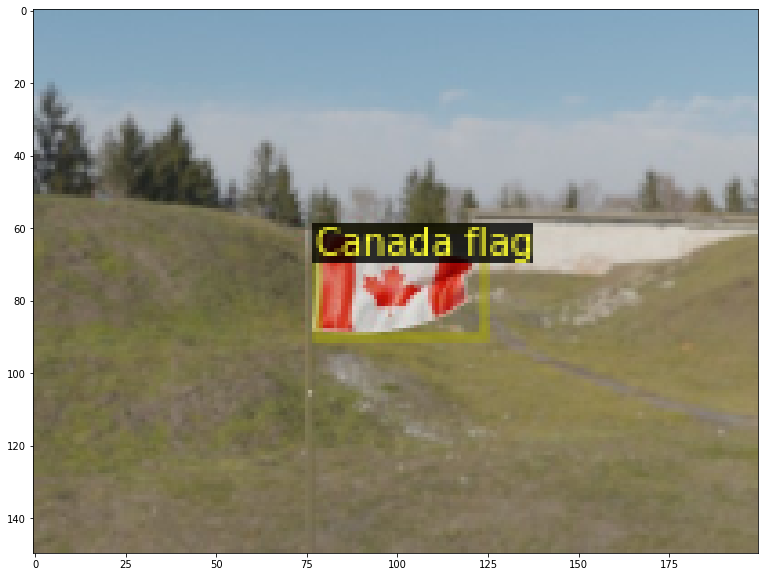

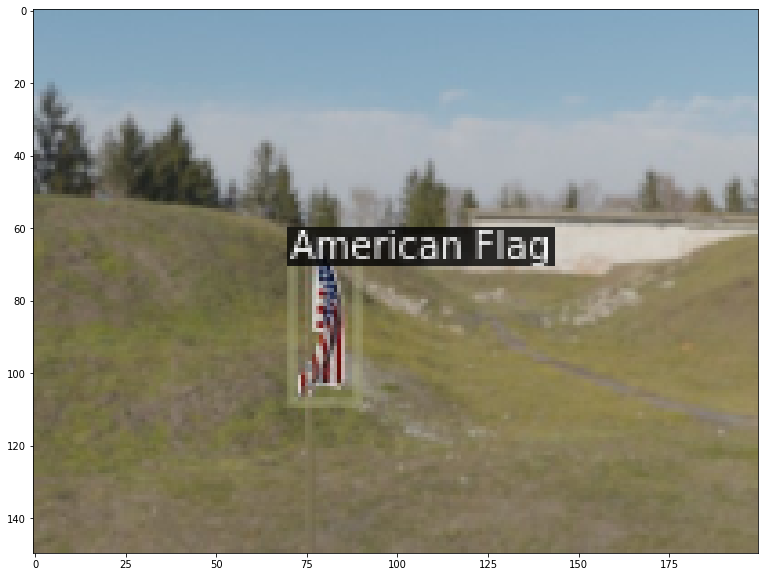

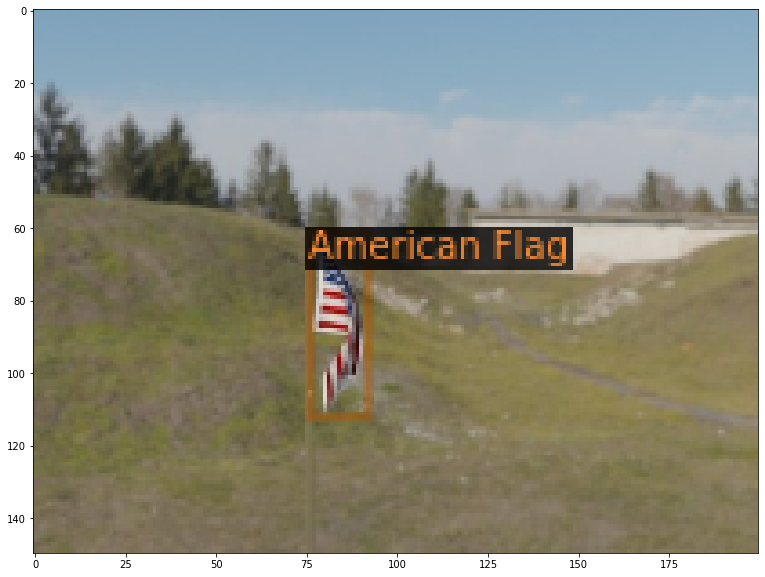

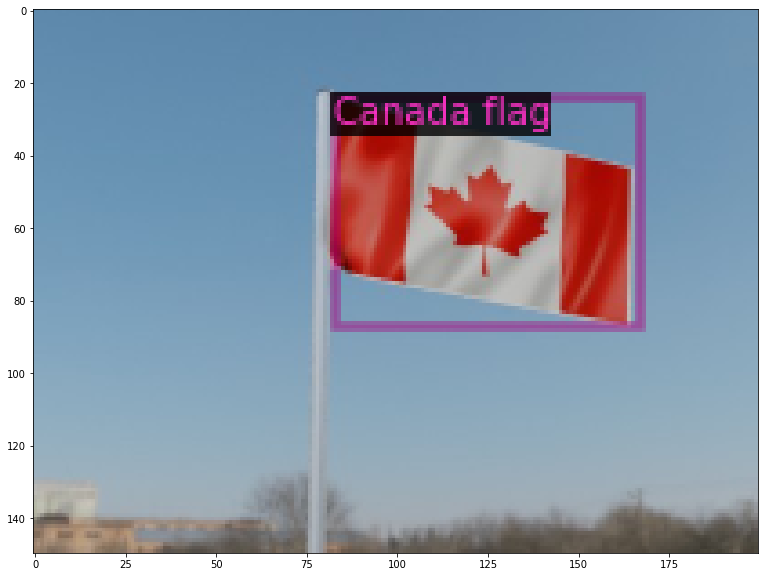

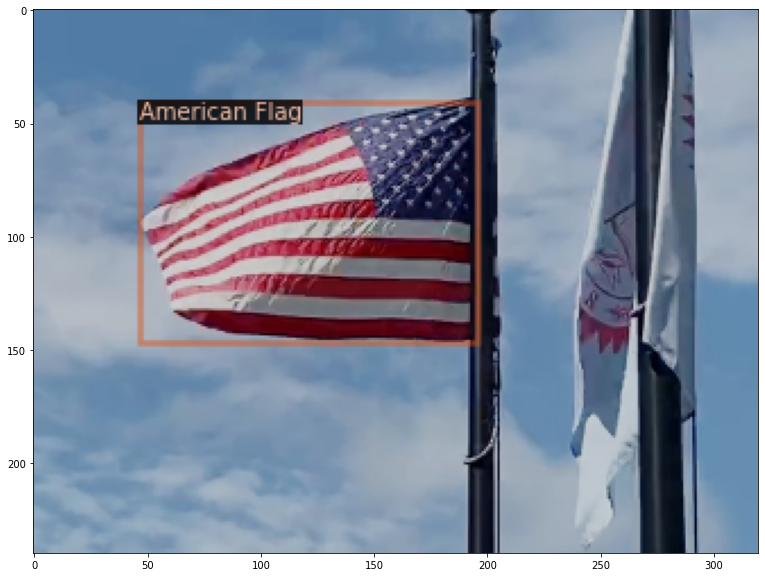

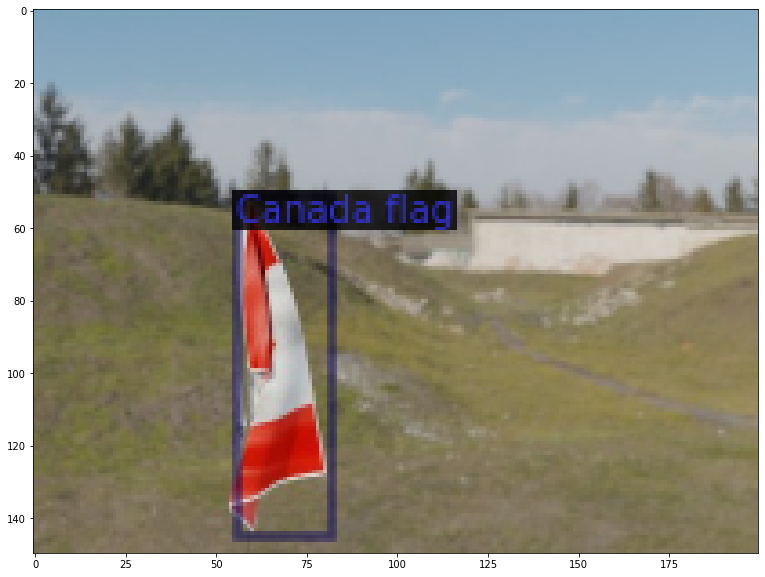

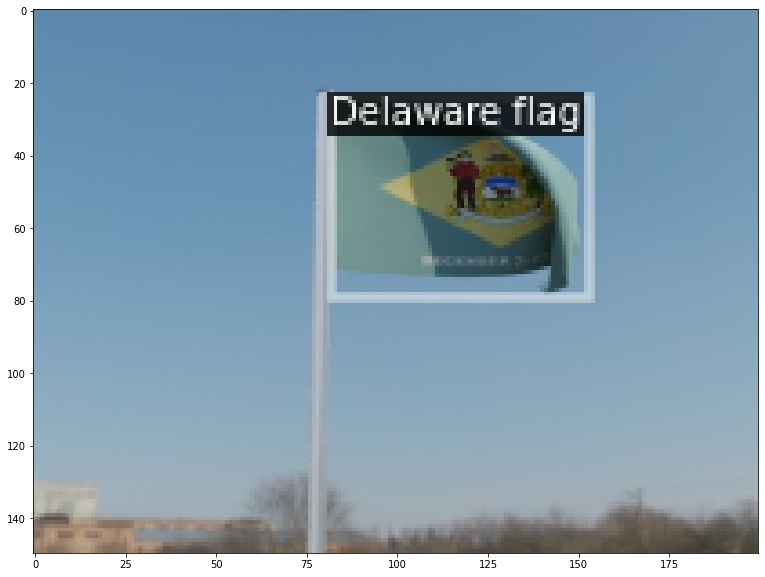

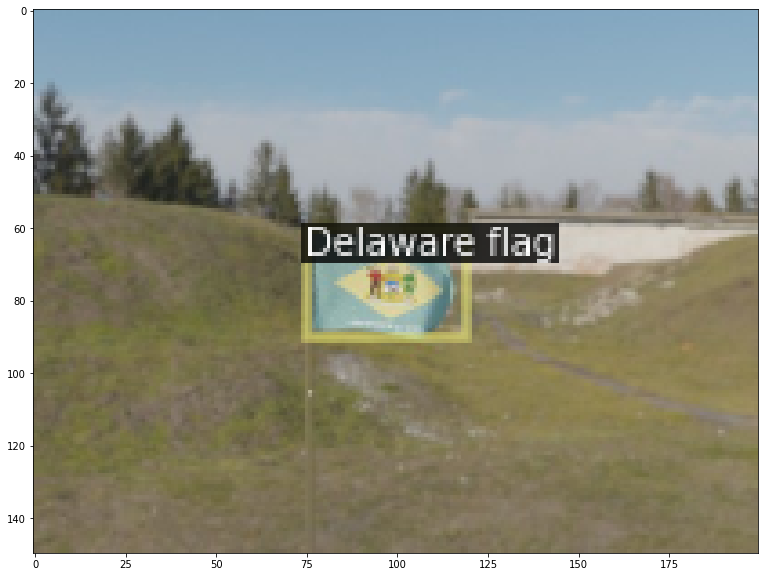

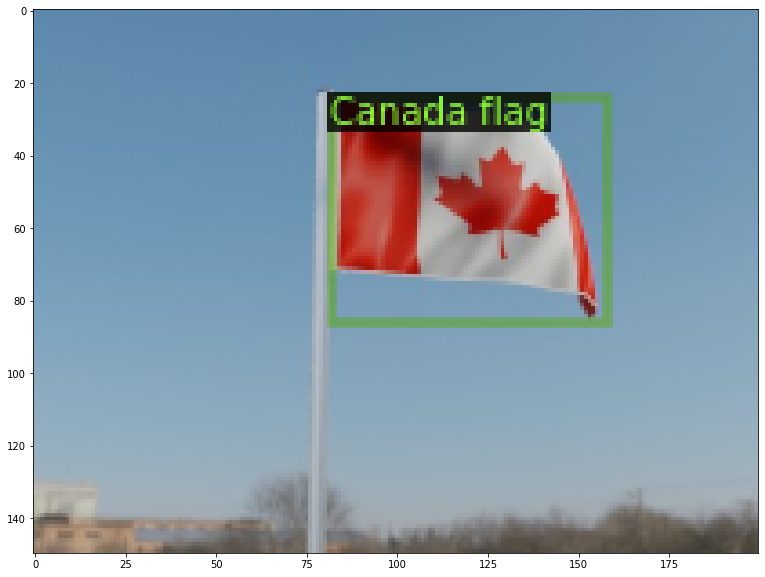

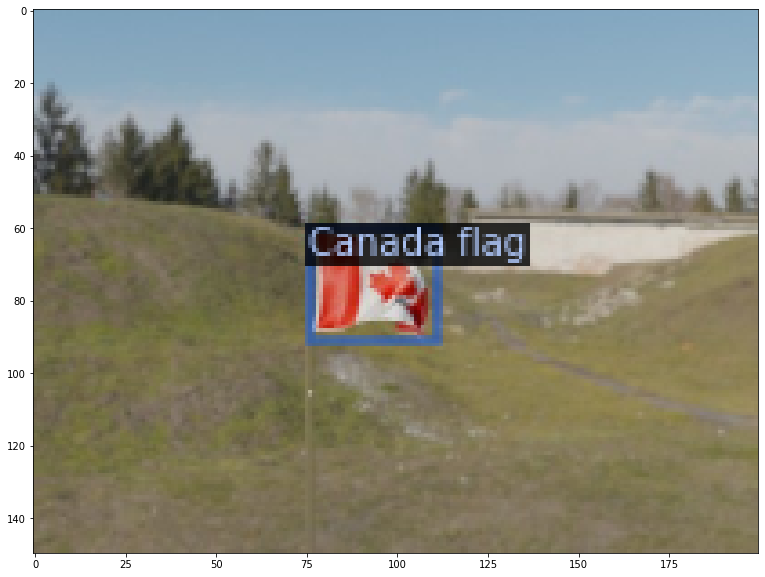

In [13]:
import random
from detectron2.utils.visualizer import Visualizer

dataset_dicts = DatasetCatalog.get('flagck1/train')
for d in random.sample(dataset_dicts, 10):
    img = cv2.imread(d["file_name"])
    v = Visualizer(img[:, :, ::-1], metadata=flag_metadata, scale=0.5)
    v = v.draw_dataset_dict(d)
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

In [14]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ('flagck1/train',)
cfg.DATASETS.TEST = ()   # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.MAX_ITER = 1000
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[10/08 22:35:29 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f6e8b1.pkl: 243MB [00:03, 72.4MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (5, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (5,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (16, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (16,) in the model! You might want to double check if this is expected.


[10/08 22:35:39 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.6/dist-packages/detectron2/layers/wrappers.py:226: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  return x.nonzero().unbind(1)


[10/08 22:35:51 d2.utils.events]:  eta: 0:09:39  iter: 19  total_loss: 0.826  loss_cls: 0.678  loss_box_reg: 0.147  loss_rpn_cls: 0.003  loss_rpn_loc: 0.004  time: 0.5949  data_time: 0.0145  lr: 0.000400  max_mem: 3206M
[10/08 22:36:03 d2.utils.events]:  eta: 0:09:31  iter: 39  total_loss: 0.330  loss_cls: 0.145  loss_box_reg: 0.179  loss_rpn_cls: 0.000  loss_rpn_loc: 0.003  time: 0.6002  data_time: 0.0048  lr: 0.000799  max_mem: 3206M
[10/08 22:36:15 d2.utils.events]:  eta: 0:09:25  iter: 59  total_loss: 0.273  loss_cls: 0.109  loss_box_reg: 0.163  loss_rpn_cls: 0.000  loss_rpn_loc: 0.002  time: 0.6049  data_time: 0.0048  lr: 0.001199  max_mem: 3206M
[10/08 22:36:28 d2.utils.events]:  eta: 0:09:20  iter: 79  total_loss: 0.241  loss_cls: 0.087  loss_box_reg: 0.149  loss_rpn_cls: 0.000  loss_rpn_loc: 0.002  time: 0.6133  data_time: 0.0047  lr: 0.001598  max_mem: 3206M
[10/08 22:36:41 d2.utils.events]:  eta: 0:09:14  iter: 99  total_loss: 0.241  loss_cls: 0.087  loss_box_reg: 0.156  loss

In [15]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8   # set the testing threshold for this model
cfg.DATASETS.TEST = ('flagck1/test', )
predictor = DefaultPredictor(cfg)

In [16]:
df_test = pd.read_csv('Detectron2//test_labels.csv')
df_test

,filename,width,height,class,xmin,ymin,xmax,ymax
0,0009.jpg,400,300,Canada flag,167,46,337,170
1,0039.jpg,400,300,American Flag,154,121,234,215
2,0144.jpg,400,300,American Flag,146,123,177,214
3,0160.jpg,400,300,Delaware flag,165,46,333,160
4,0185.jpg,400,300,Delaware flag,165,50,321,171
5,0250.jpg,400,300,Canada flag,166,48,336,151
6,0380.jpg,640,480,American Flag,49,48,408,441


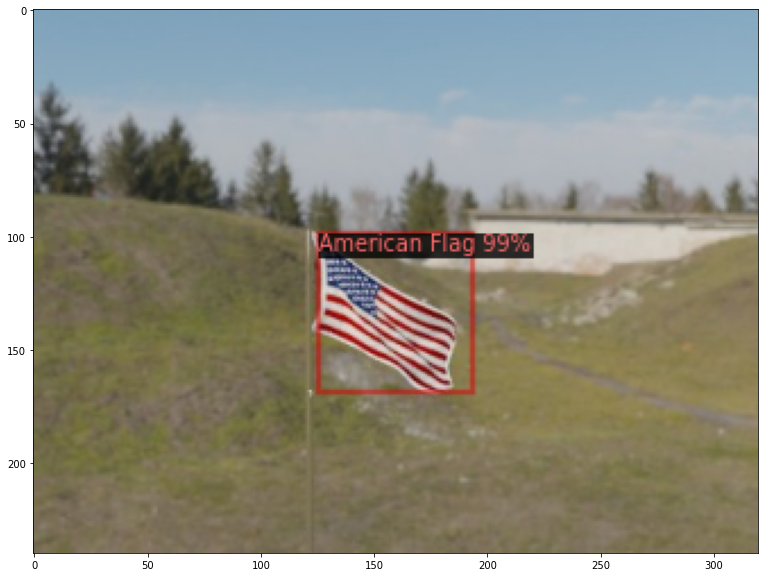

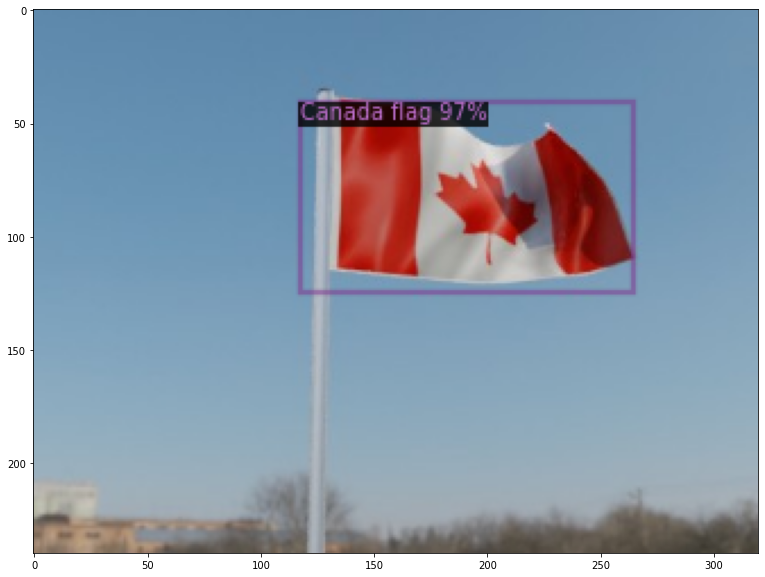

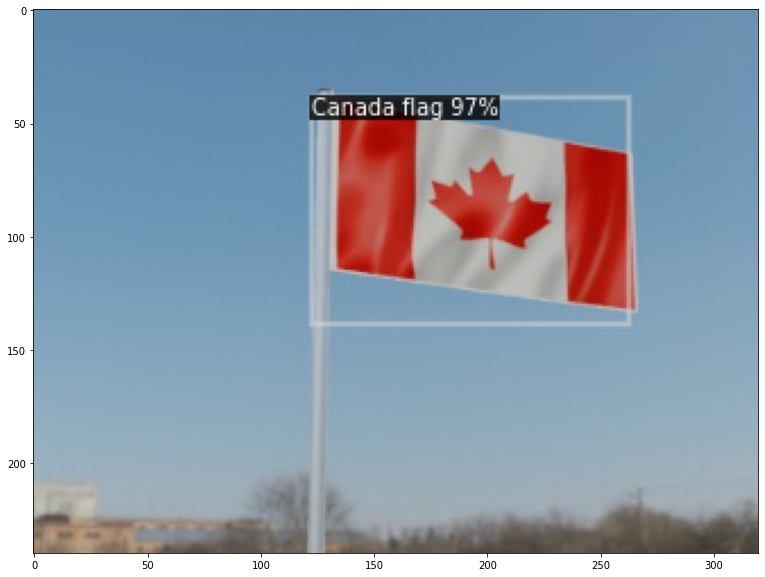

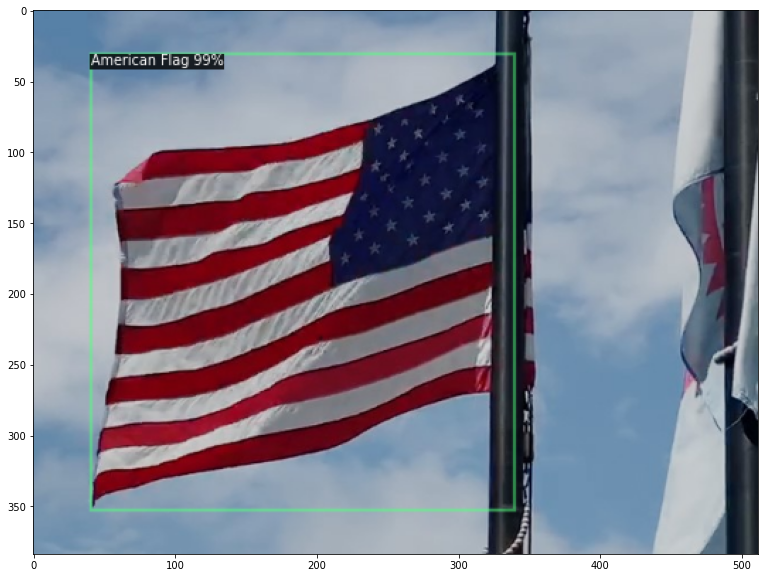

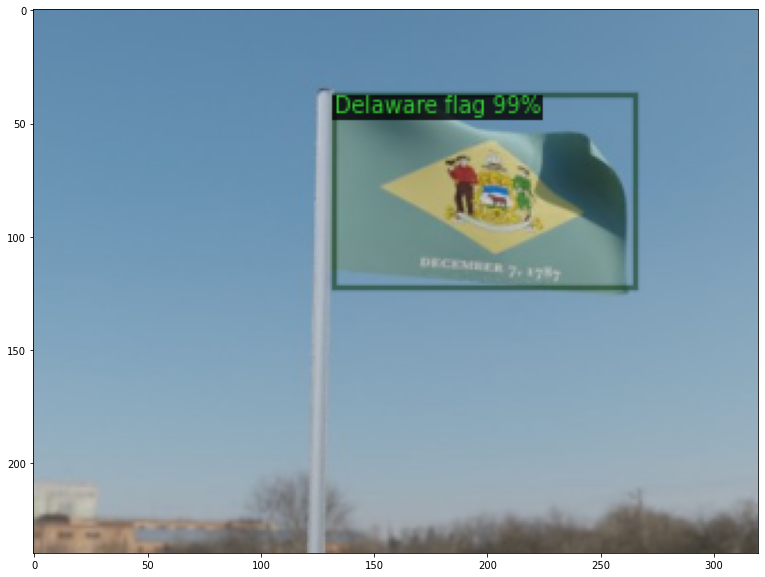

In [17]:
from detectron2.utils.visualizer import ColorMode
import random

dataset_dicts = DatasetCatalog.get('flagck1/test')
for d in random.sample(dataset_dicts, 5):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], metadata=flag_metadata, scale=0.8)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

from detectron2.utils.visualizer import ColorMode
import random
import os
path = 'nobox'
dirs = os.listdir(path)





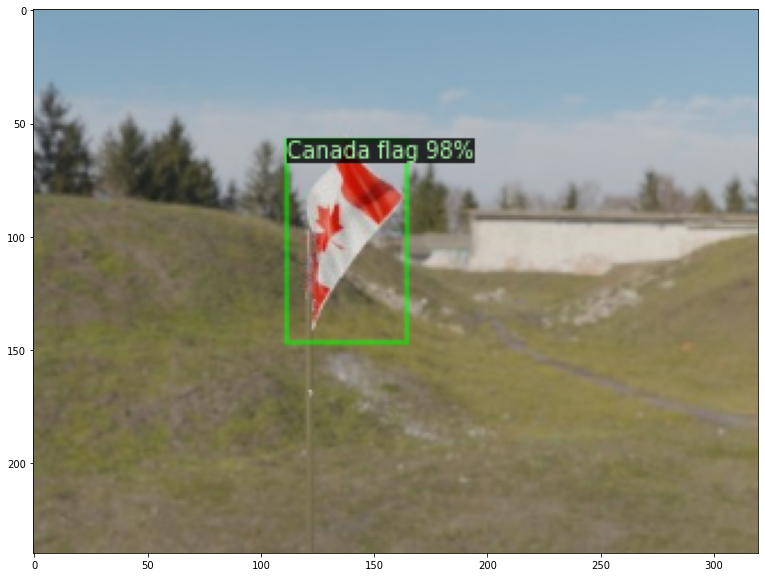

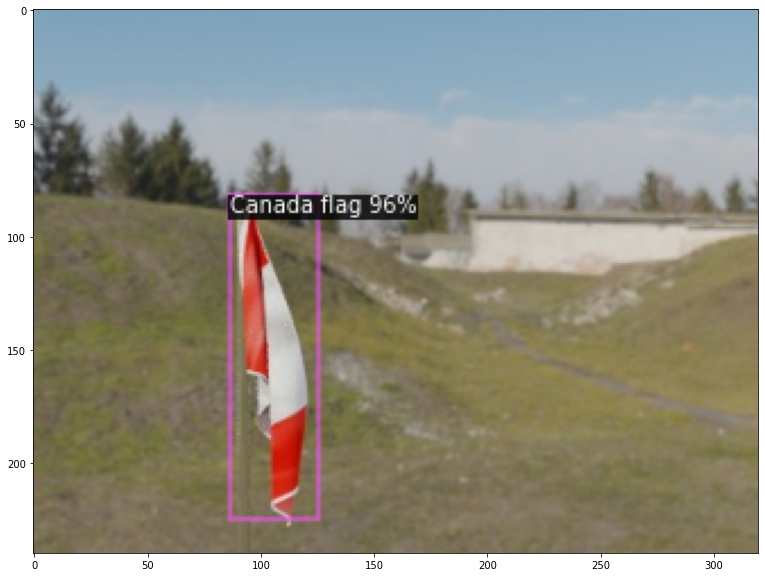

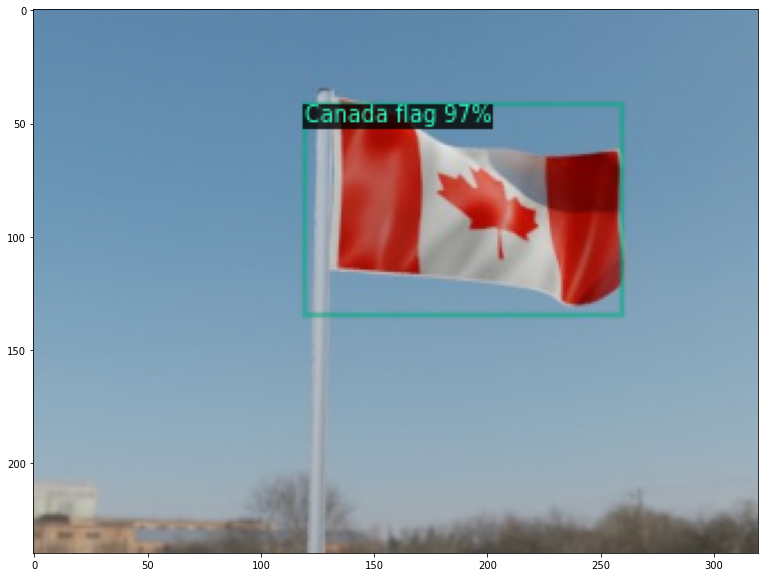

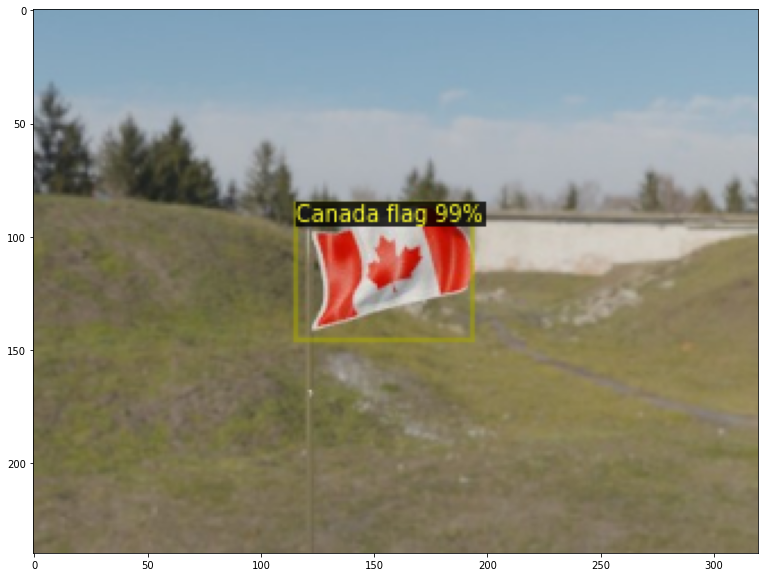

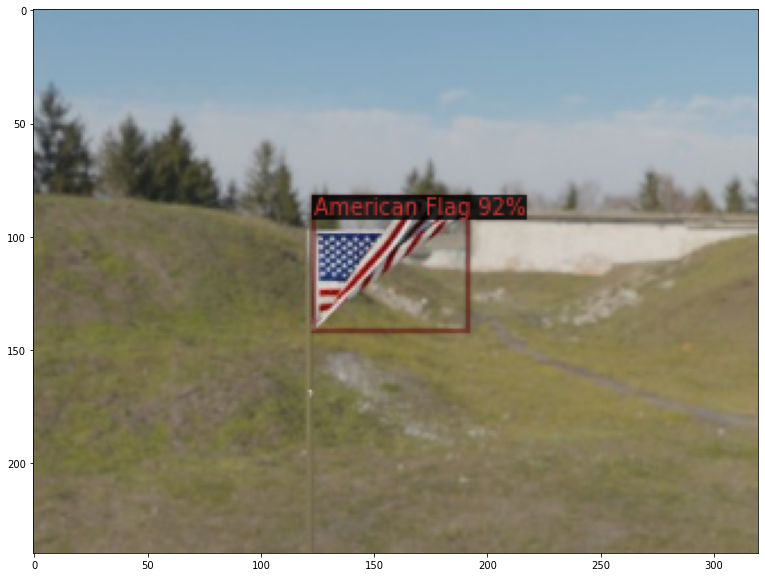

...

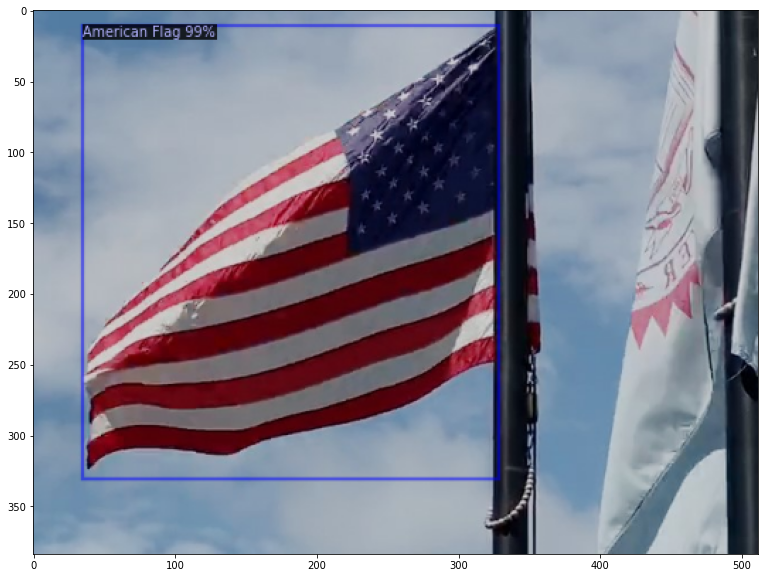

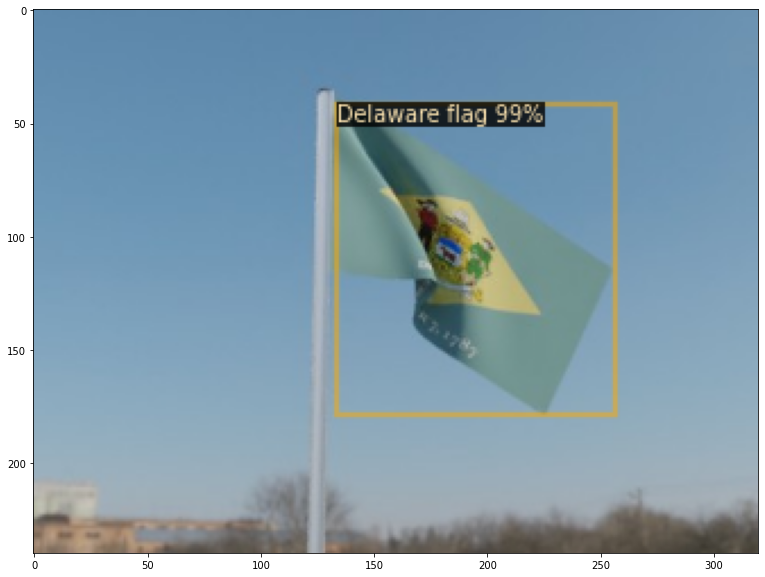

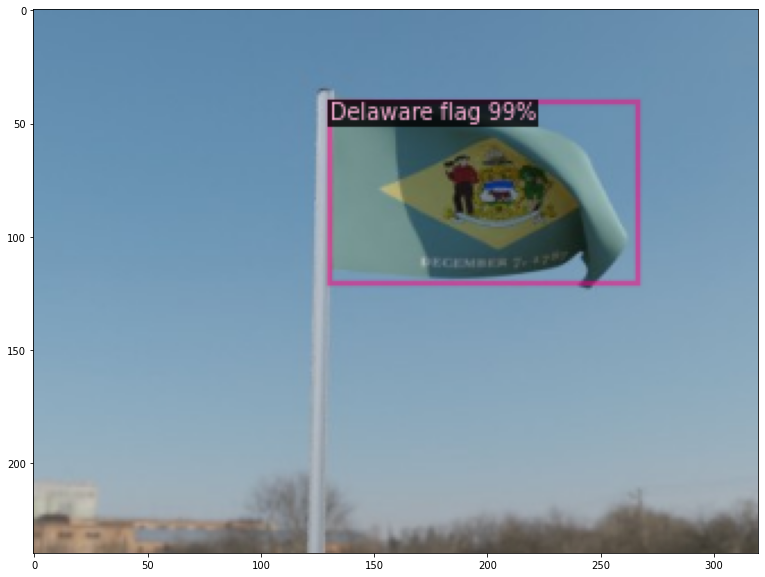

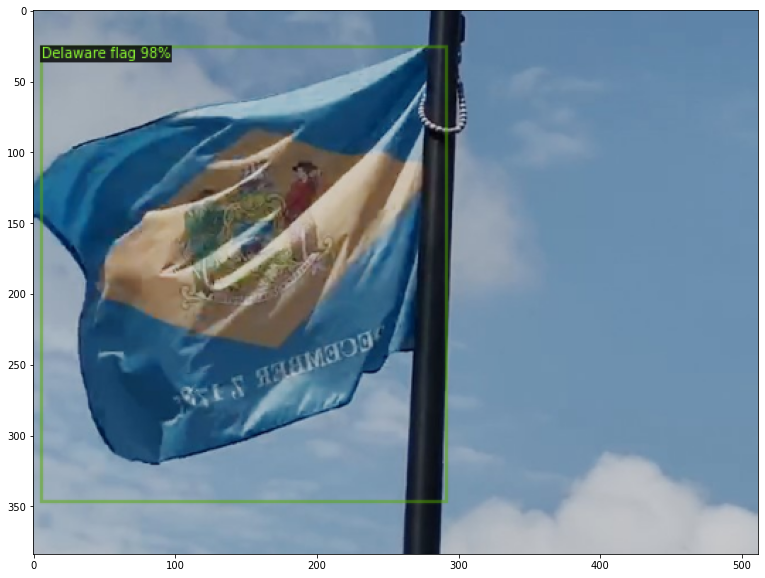

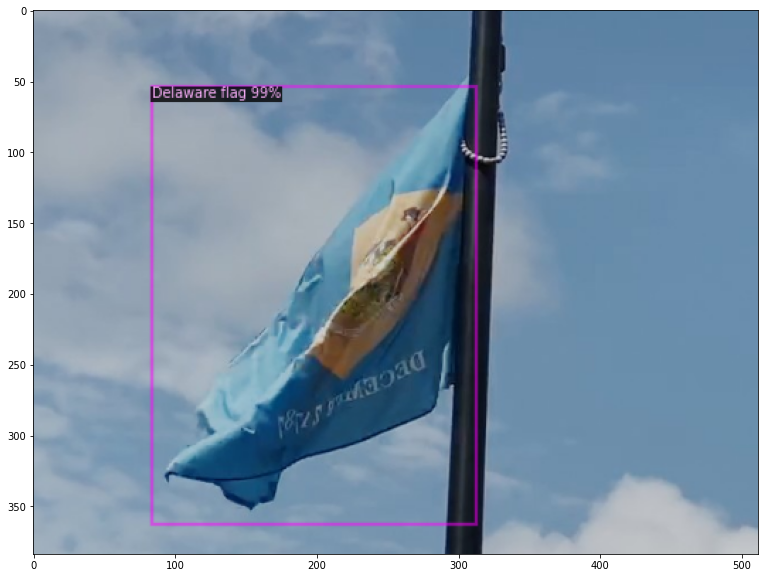

In [58]:
from detectron2.utils.visualizer import ColorMode
import random

im1 = cv2.imread('0001.jpg')
outputs = predictor(im1)
v = Visualizer(im1[:, :, ::-1], metadata=flag_metadata, scale=0.8)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize = (14, 10))
plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
plt.show()

im2 = cv2.imread('0002.jpg')
outputs = predictor(im2)
v = Visualizer(im2[:, :, ::-1], metadata=flag_metadata, scale=0.8)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize = (14, 10))
plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
plt.show()

im3 = cv2.imread('0003.jpg')
outputs = predictor(im3)
v = Visualizer(im3[:, :, ::-1], metadata=flag_metadata, scale=0.8)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize = (14, 10))
plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
plt.show()


im4 = cv2.imread('0004.jpg')
outputs = predictor(im4)
v = Visualizer(im4[:, :, ::-1], metadata=flag_metadata, scale=0.8)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize = (14, 10))
plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
plt.show()

im5 = cv2.imread('0005.jpg')
outputs = predictor(im5)
v = Visualizer(im5[:, :, ::-1], metadata=flag_metadata, scale=0.8)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize = (14, 10))
plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
plt.show()

im6 = cv2.imread('0006.jpg')
outputs = predictor(im6)
v = Visualizer(im6[:, :, ::-1], metadata=flag_metadata, scale=0.8)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize = (14, 10))
plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
plt.show()

im7 = cv2.imread('0007.jpg')
outputs = predictor(im7)
v = Visualizer(im7[:, :, ::-1], metadata=flag_metadata, scale=0.8)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize = (14, 10))
plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
plt.show()

im8 = cv2.imread('0008.jpg')
outputs = predictor(im8)
v = Visualizer(im8[:, :, ::-1], metadata=flag_metadata, scale=0.8)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize = (14, 10))
plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
plt.show()

im9 = cv2.imread('0009.jpg')
outputs = predictor(im9)
v = Visualizer(im9[:, :, ::-1], metadata=flag_metadata, scale=0.8)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize = (14, 10))
plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
plt.show()

im10 = cv2.imread('0010.jpg')
outputs = predictor(im10)
v = Visualizer(im10[:, :, ::-1], metadata=flag_metadata, scale=0.8)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize = (14, 10))
plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
plt.show()

im11 = cv2.imread('0011.jpg')
outputs = predictor(im11)
v = Visualizer(im11[:, :, ::-1], metadata=flag_metadata, scale=0.8)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize = (14, 10))
plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
plt.show()

im12 = cv2.imread('0012.jpg')
outputs = predictor(im12)
v = Visualizer(im12[:, :, ::-1], metadata=flag_metadata, scale=0.8)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize = (14, 10))
plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
plt.show()

.ipynb_checkpoints
imread failed on None
0004.jpg


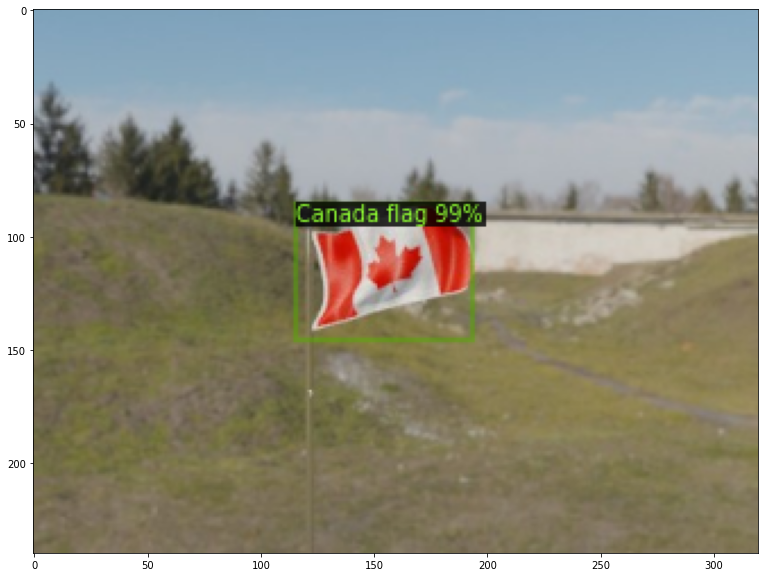

0000.jpg
imread failed on None
0002.jpg


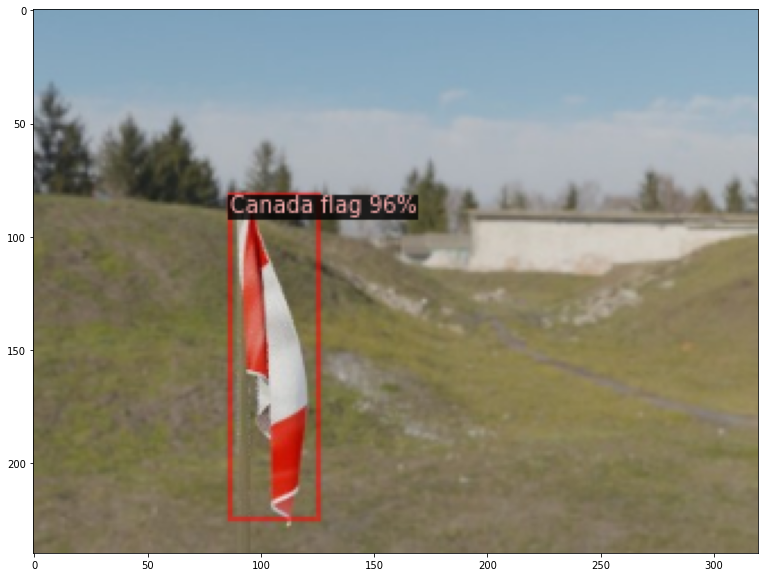

0008.jpg


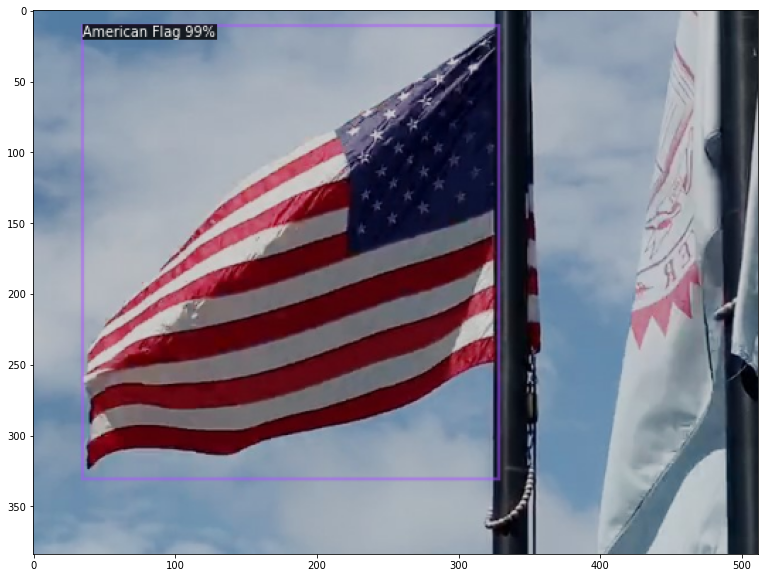

0007.jpg


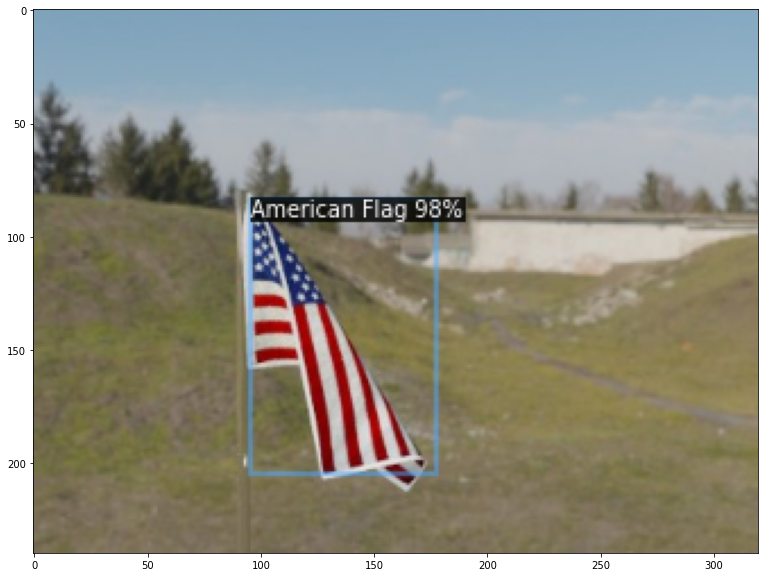

0012.jpg


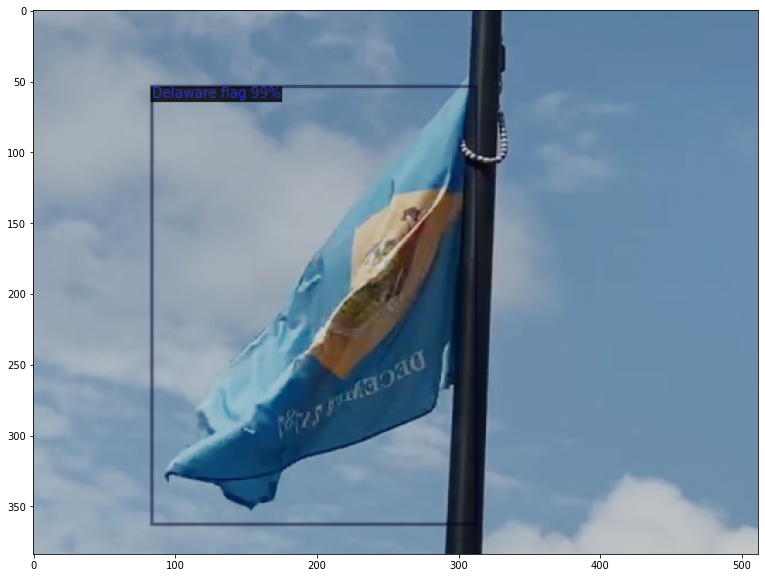

0010.jpg


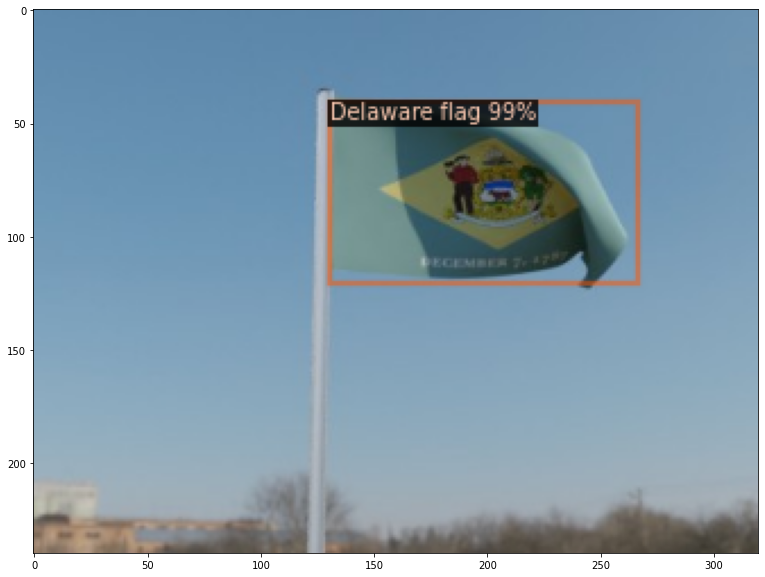

0807.jpg
imread failed on None
0819.jpg
imread failed on None
0009.jpg


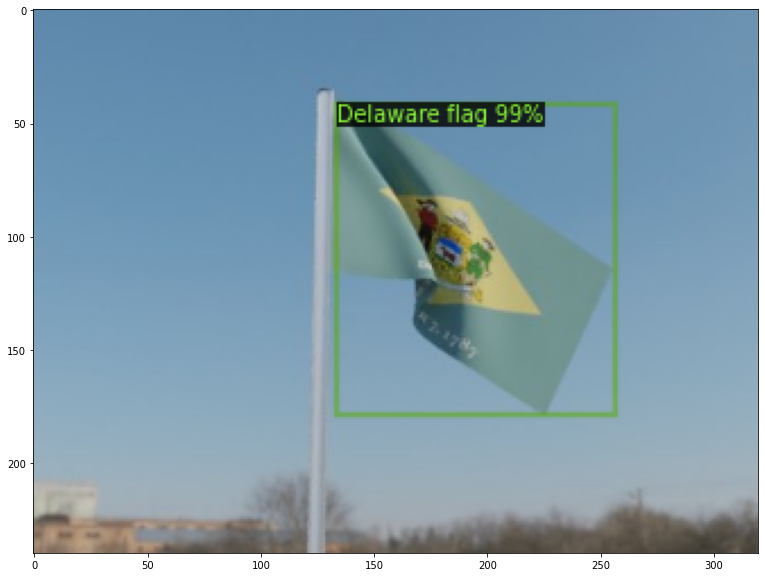

0832.jpg
imread failed on None
0808.jpg
imread failed on None
0005.jpg


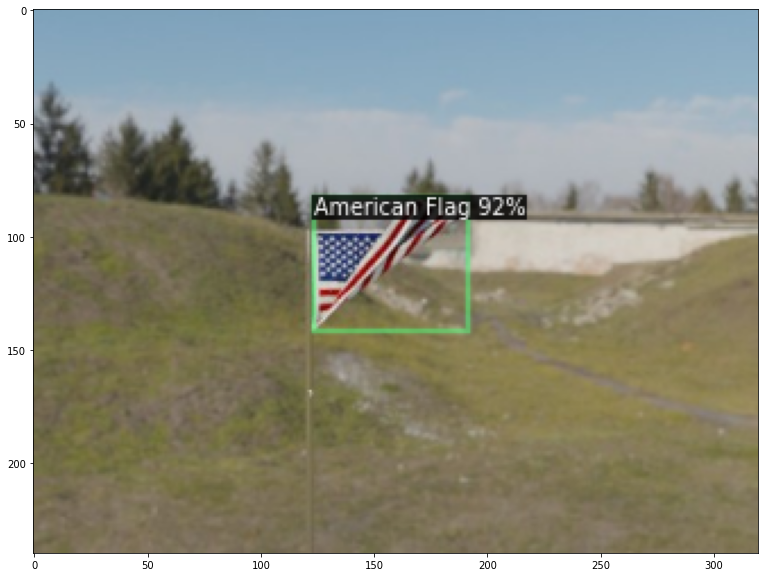

0003.jpg


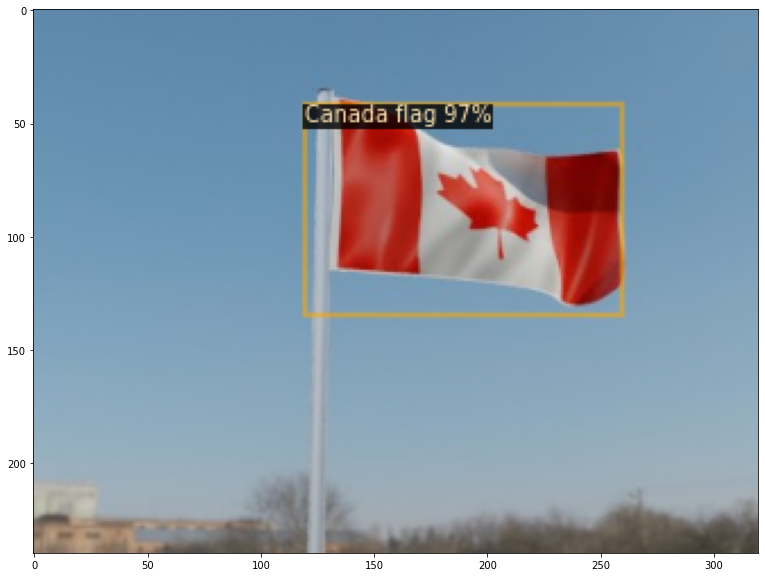

0820.jpg
imread failed on None
0001.jpg


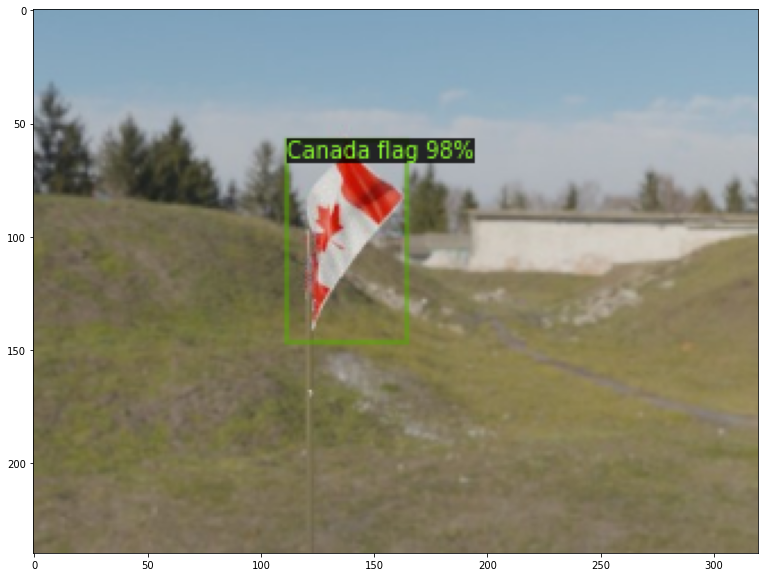

0831.jpg
imread failed on None
0006.jpg


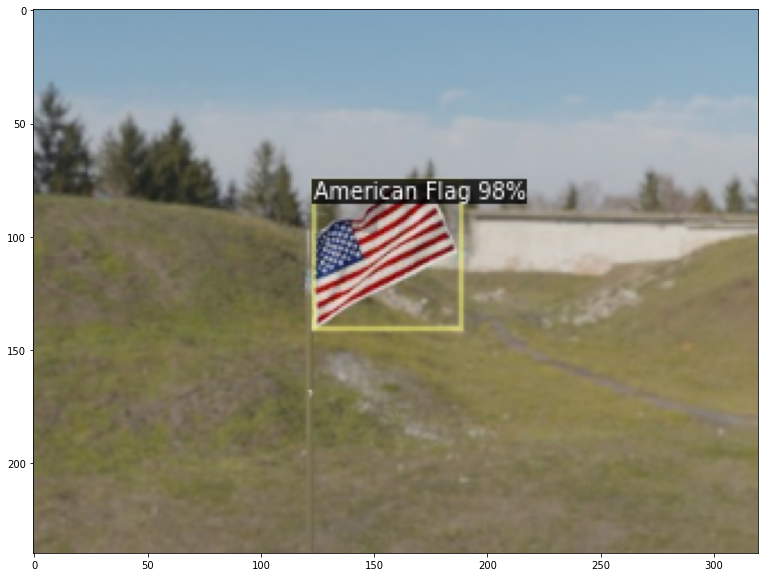

0011.jpg


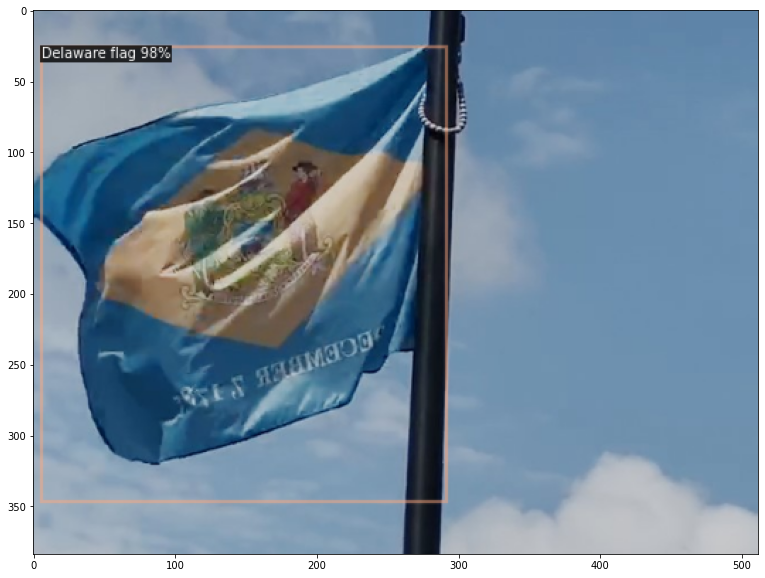

In [106]:
from detectron2.utils.visualizer import ColorMode
import random
import os
import cv2
import numpy as np

path = 'nobox'

for im in dirs:

  print(im)
  img = cv2.imread(im)
  if img is None:
    print("imread failed on {}".format(img))
  else:
    
    outputs = predictor(img)
    v = Visualizer(img[:, :, ::-1], metadata=flag_metadata, scale=0.8)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()




